# 2nd-level Group Analysis

We can now do the group analysis. 

This example will also directly include thresholding of the output, as well as some visualization.


## Imports (SPM12)

First, we need to import all the modules we later want to use.

In [3]:
from nilearn import plotting
%matplotlib inline
from os.path import join as opj
import numpy as np
from nipype.interfaces.io import SelectFiles, DataSink, JSONFileSink
from nipype.interfaces.spm import (OneSampleTTestDesign, EstimateModel,
                                   EstimateContrast, Threshold, PairedTTestDesign,TwoSampleTTestDesign)
from nipype.interfaces.utility import IdentityInterface
from nipype import Workflow, Node
import nipype.pipeline.engine as pe
from nipype.interfaces.fsl import Info
from nipype.algorithms.misc import Gunzip
# MATLAB - Specify path to current SPM and the MATLAB's default mode
from nipype.interfaces.matlab import MatlabCommand
MatlabCommand.set_default_paths('/imaging/su01/spm12')
MatlabCommand.set_default_matlab_cmd("matlab -nodesktop -nosplash")

## Experiment parameters

It's always a good idea to specify all parameters that might change between experiments at the beginning of your script.

In [25]:
input_dir = '/imaging/su01/RED/1stlevel_output'
experiment_dir = '/imaging/su01/RED/bids/derivatives/fmriprep-1.5.0/fmriprep'
output_dir = '/imaging/su01/RED/2ndlevel_output'
working_dir = '/imaging/su01/RED/2ndlevel_workingdir'

# Which contrasts to use for the 2nd-level analysis
contrast_list = ['con_0003']#'con_0001','con_0002','con_0003']#,'con_0004','con_0005','con_0006']
#contrast_list = ['1', '2']

mask = 'imaging/su01/RED/RED_threshGM_mask.nii'
#'/imaging/mz01/fmriprep/GM_mask.nii'#"/imaging/mz01/osl2.0.3.2/std_masks/MNI152_T1_1mm_brain.nii.gz" 


## Contrast list

- cont01 = con_0001 = NoGo > Go
- cont02 = con_0002 = Face > Control
- cont03 = con_0003 = Sad > Neutral
- cont04 = con_0004 = Happy > Neutral
- cont05 = con_0005 = Sad > Happy
- cont06 = con_0006 = Happy > Sad
- cont07 = con_0007 = Sad > Control
- cont08 = con_0008 = Sad NoGo > Sad Go

## Specify Nodes

Initiate all the different interfaces (represented as nodes) that you want to use in your workflow.

In [26]:
#unzip nii.gz files
#gunzip_con = MapNode(Gunzip(), name="gunzip_con", iterfield=['in_file'])
# OneSampleTTestDesign - creates one sample T-Test Design
onesamplettestdes = Node(OneSampleTTestDesign(),
                         name="onesampttestdes")
#onesamplettestdes.inputs.explicit_mask_file = mask

# EstimateModel - estimates the model
level2estimate = Node(EstimateModel(estimation_method={'Classical': 1}),
                      name="level2estimate")

# EstimateContrast - estimates group contrast
level2conestimate = Node(EstimateContrast(group_contrast=True),
                         name="level2conestimate")
cont1 = ['Group', 'T', ['mean'], [1]]
level2conestimate.inputs.contrasts = [cont1]

# Threshold - thresholds contrasts
level2thresh = Node(Threshold(contrast_index=1,
                              use_topo_fdr=False,
                              use_fwe_correction=False,
                              extent_threshold=0,
                              height_threshold=0.001, #voxel thresholds
                              height_threshold_type='p-value'),
                              #extent_fdr_p_threshold=0.05),#FDR cluster threshold
                    name="level2thresh")

## Specify input & output stream (SPM12)

Specify where the input data can be found & where and how to save the output data.

In [27]:
# Infosource - a function free node to iterate over the list of subject names
infosource = Node(IdentityInterface(fields=['contrast_id']),
                  name="infosource")
infosource.iterables = [('contrast_id', contrast_list)]

# SelectFiles - to grab the data (alternativ to DataGrabber)
templates = {'cons':  opj(input_dir, '1stLevel/*/{contrast_id}.nii')}
selectfiles = Node(SelectFiles(templates,
                               base_directory=experiment_dir,
                               sort_filelist=True),
                   name="selectfiles")

# Datasink - creates output folder for important outputs
datasink = Node(DataSink(base_directory=experiment_dir,
                         container=output_dir),
                name="datasink")
#Store some stats into a json file
from nipype import Function
def statsSink_func(x,y, output_dir):
    import glob
    from os.path import join as opj
    if len(glob.glob(opj(output_dir, '*.txt')))==0:
        f=open(opj(output_dir, 'ThresholdStats.txt'), 'w')
    else:
        f=open(opj(output_dir, 'ThresholdStats.txt'), 'a')
    f.write('n_clusters: %d;  cluster_forming_threshold: %.1f; \n' % (x, y))
    f.close()
statsSink = Function(["x","y", "output_dir"], ['output'],statsSink_func)
statsSink.inputs.output_dir = output_dir
valuesink = pe.MapNode(interface=statsSink, name='valuesink', iterfield=["x","y"])

# Use the following DataSink output substitutions
substitutions = [('_contrast_id_', '')]
datasink.inputs.substitutions = substitutions

## Specify Workflow (SPM12)

Create a workflow and connect the interface nodes and the I/O stream to each other.

In [28]:
# Initiation of the 2nd-level analysis workflow
l2analysis = Workflow(name='spm_l2analysis')
l2analysis.base_dir = opj(experiment_dir, working_dir)

# Connect up the 2nd-level analysis components
l2analysis.connect([(infosource, selectfiles, [('contrast_id', 'contrast_id')]),
                    (selectfiles, onesamplettestdes, [('cons', 'in_files')]),
#                      (selectfiles, gunzip_con, [('cons', 'in_file')]),
#                     (gunzip_con, onesamplettestdes, [('out_file',  
#                                                      'in_files')]),
                    (onesamplettestdes, level2estimate, [('spm_mat_file',
                                                          'spm_mat_file')]),
                    (level2estimate, level2conestimate, [('spm_mat_file',
                                                          'spm_mat_file'),
                                                         ('beta_images',
                                                          'beta_images'),
                                                         ('residual_image',
                                                          'residual_image')]),
                    (level2conestimate, level2thresh, [('spm_mat_file',
                                                        'spm_mat_file'),
                                                       ('spmT_images',
                                                        'stat_image'),
                                                       ]),
                    (level2conestimate, datasink, [('spm_mat_file',
                                                    '2ndLevel.@spm_mat'),
                                                   ('spmT_images',
                                                    '2ndLevel.@T'),
                                                   ('con_images',
                                                    '2ndLevel.@con')]),
                    (level2thresh, datasink, [('thresholded_map',
                                               '2ndLevel.@threshold'),
                                             ]),
                    (level2thresh, valuesink, [('n_clusters',
                                             'x'),
                                              ('cluster_forming_thr',
                                             'y')])
                    ])

## Visualize the workflow (SPM12)

It always helps to visualize your workflow.

In [22]:
# # Create 1st-level analysis output graph
# l2analysis.write_graph(graph2use='colored', format='png', simple_form=True)

# # Visualize the graph
# from IPython.display import Image
# Image(filename=opj(l2analysis.base_dir, 'spm_l2analysis', 'graph.png'))

##  Run the Workflow (SPM12)

Now that everything is ready, we can run the 1st-level analysis workflow. Change ``n_procs`` to the number of jobs/cores you want to use.

In [29]:
l2analysis.run('MultiProc', plugin_args={'n_procs': 6})

210121-05:12:22,120 nipype.workflow INFO:
	 Workflow spm_l2analysis settings: ['check', 'execution', 'logging', 'monitoring']
210121-05:12:22,151 nipype.workflow INFO:
	 Running in parallel.
210121-05:12:22,156 nipype.workflow INFO:
	 [MultiProc] Running 0 tasks, and 1 jobs ready. Free memory (GB): 113.12/113.12, Free processors: 6/6.
210121-05:12:22,254 nipype.workflow INFO:
	 [Node] Setting-up "spm_l2analysis.selectfiles" in "/imaging/su01/RED/2ndlevel_workingdir/spm_l2analysis/_contrast_id_con_0003/selectfiles".
210121-05:12:22,272 nipype.workflow INFO:
	 [Node] Running "selectfiles" ("nipype.interfaces.io.SelectFiles")
210121-05:12:22,303 nipype.workflow INFO:
	 [Node] Finished "spm_l2analysis.selectfiles".
210121-05:12:24,158 nipype.workflow INFO:
	 [Job 0] Completed (spm_l2analysis.selectfiles).
210121-05:12:24,163 nipype.workflow INFO:
	 [MultiProc] Running 0 tasks, and 1 jobs ready. Free memory (GB): 113.12/113.12, Free processors: 6/6.
210121-05:12:24,253 nipype.workflow INFO:

# Visualize results

Now we create a lot of outputs, but how do they look like? And also, what was the influence of different smoothing kernels and normalization?

**we chose a voxel-wise threshold of *`p<0.001`* and corrected for multiple comparisons with a cluster-wise FDR threshold of *`p<0.05`*.**


In [19]:
from nilearn import plotting
%matplotlib inline
anatimg = '/imaging/su01/std_masks/MNI152_T1_2mm_brain.nii.gz'

/imaging/local/software/miniconda/envs/neuroconda_2_0/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exceed 0.0. But, you have given threshold=1e-06 
  threshold))
/imaging/local/software/miniconda/envs/neuroconda_2_0/lib/python3.7/site-packages/nilearn/plotting/find_cuts.py:63: UserWarning: Given img is empty. Returning default cut_coords=(0.0, 0.0, 0.0) instead.
  .format(DEFAULT_CUT_COORDS))



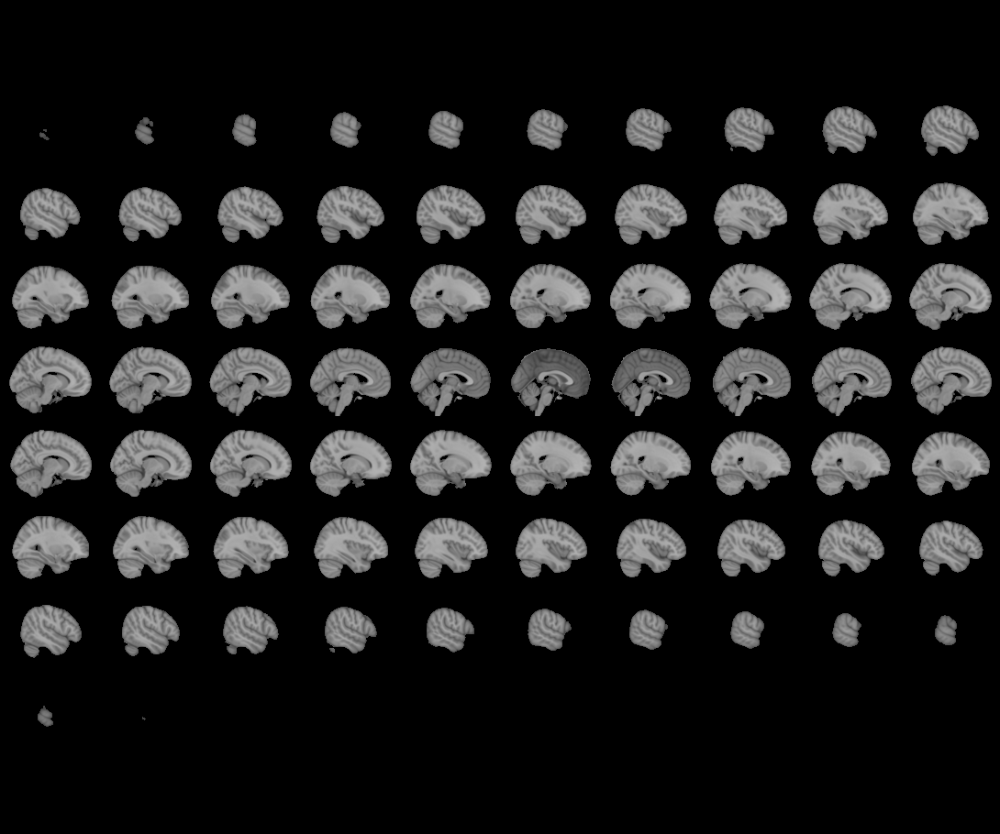
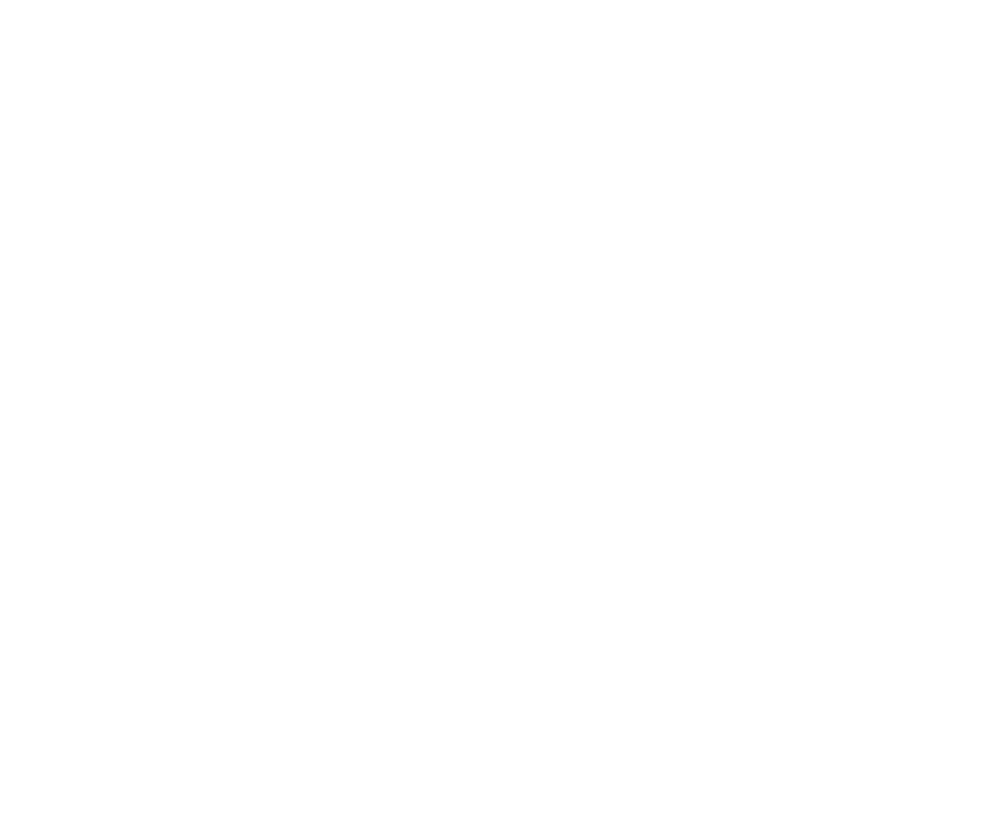

In [24]:
view = plotting.view_img(output_dir + '/2ndLevel/con_0002/spmT_0001_thr.nii', bg_img = anatimg,
                         title='Face>Control')
view


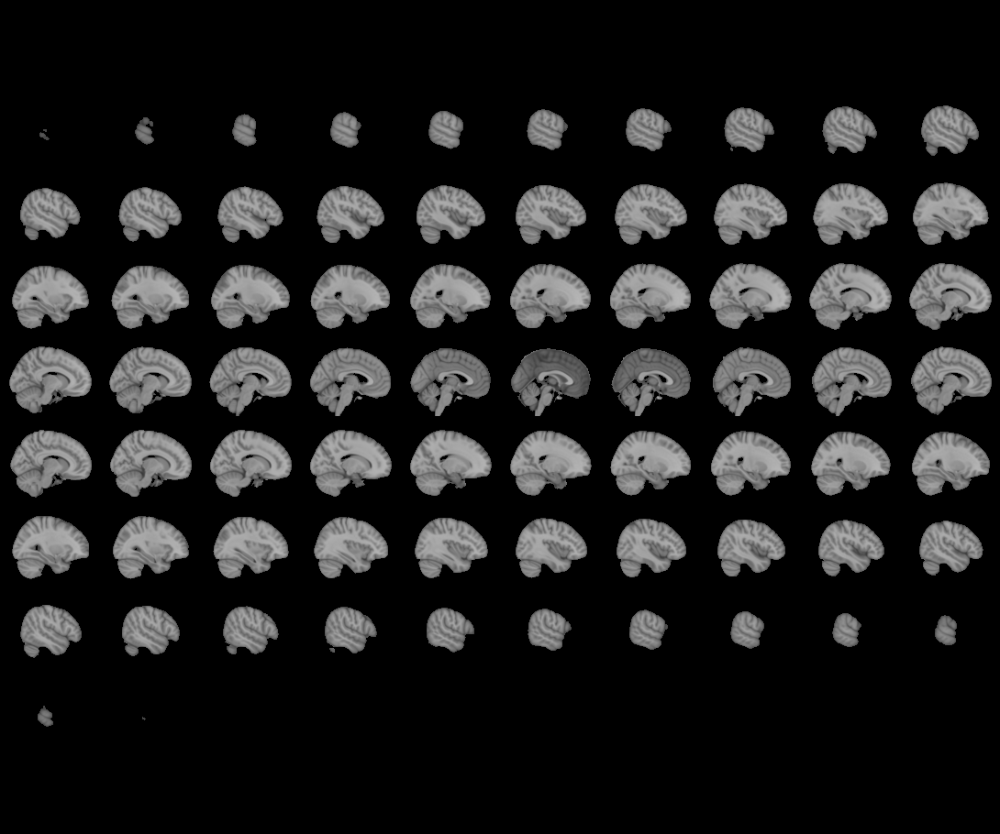
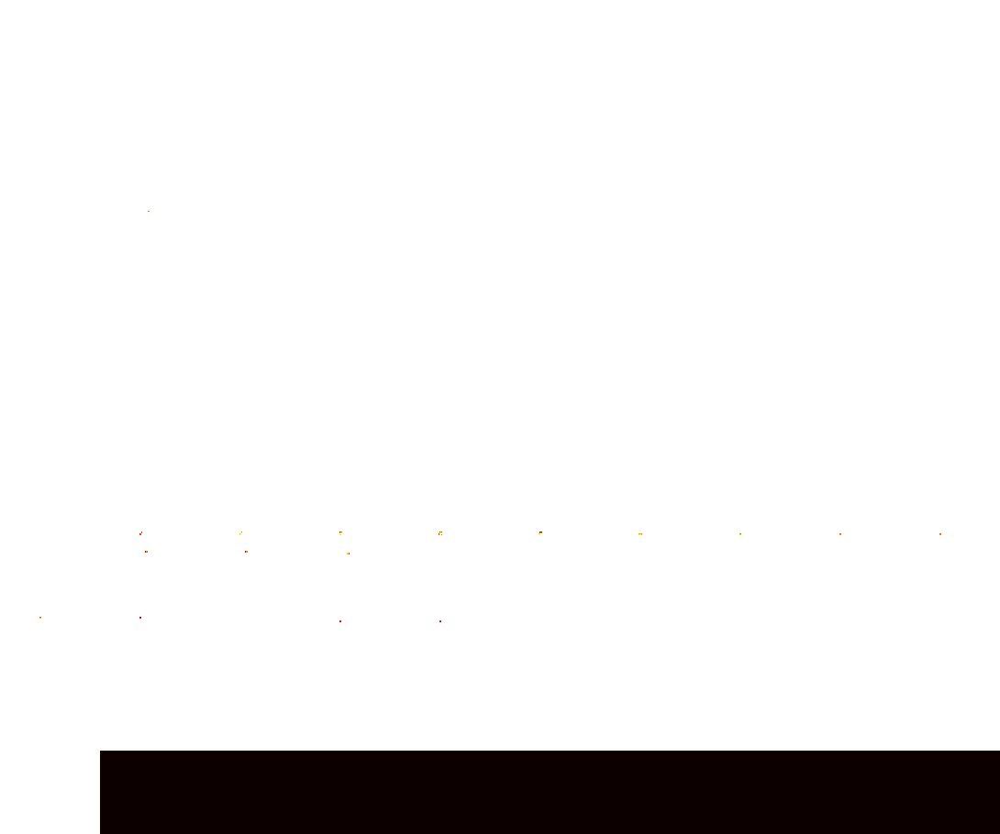

In [11]:
view = plotting.view_img(output_dir + '/2ndLevel/con_0001/spmT_0001_thr.nii', bg_img = anatimg,
                         title='NoGo > Go')
view

/imaging/local/software/miniconda/envs/neuroconda_2_0/lib/python3.7/site-packages/nilearn/reporting/html_document.py:60: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  MAX_IMG_VIEWS_BEFORE_WARNING))



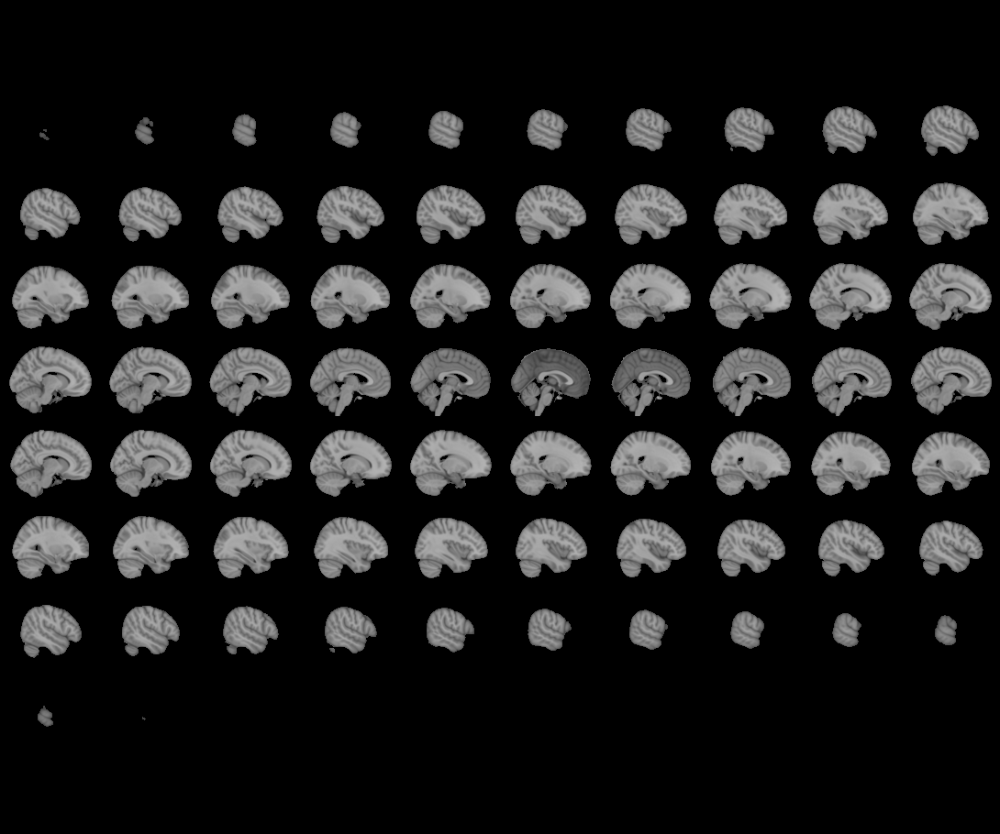
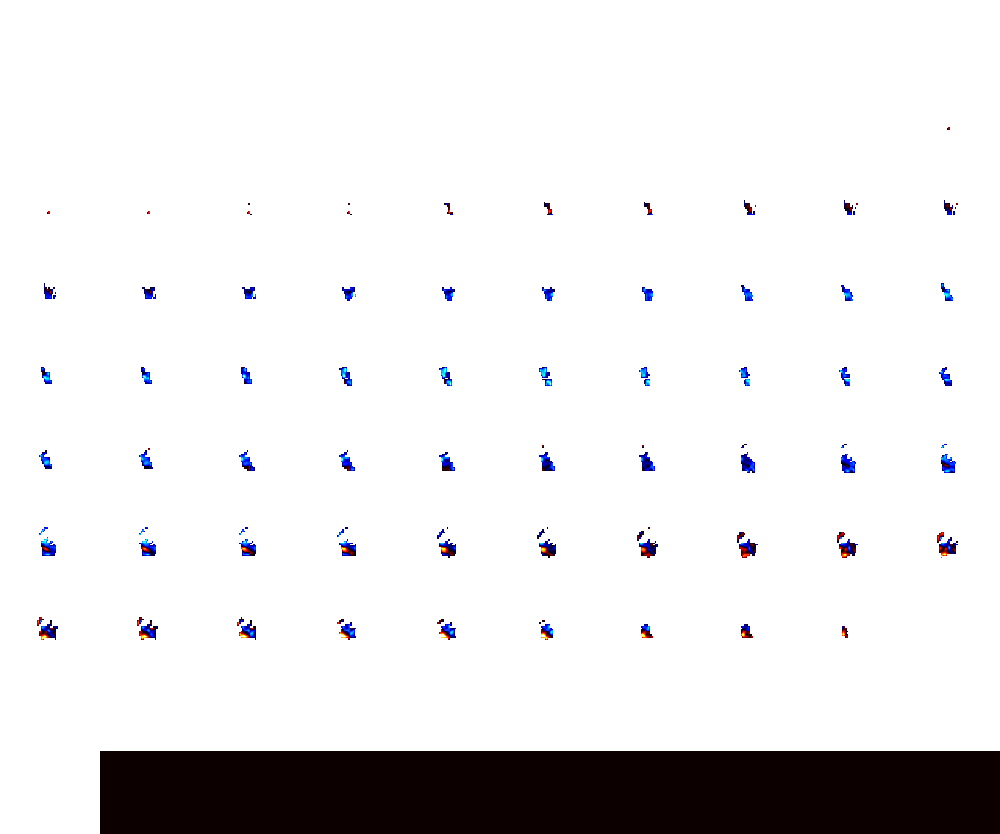

In [35]:
view = plotting.view_img(output_dir+'/2ndLevel/con_0003/spmT_0001.nii', bg_img = anatimg,
                         title='Sad > Neutral')
view

In [23]:
view = plotting.view_img('output_2level/2ndLevel/con_0003/spmT_0001_thr.nii', bg_img = anatimg,
                         title='STM_correct_load',threshold=3)
view

/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


In [24]:
view = plotting.view_img('output_2level_0001/2ndLevel/con_0003/spmT_0001_thr.nii', bg_img = anatimg,
                         title='STM_correct_load',threshold=3)
view

/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


In [773]:
view = plotting.view_img('output_2level/2ndLevel/con_0004/spmT_0001_thr.nii', bg_img = anatimg,
                         title='STM:correct>incorrect',threshold=2)
view

/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)
/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/nilearn/plotting/js_plotting_utils.py:100: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than 10 '


In [6]:
view = plotting.view_img('output_2level/2ndLevel/con_0005/spmT_0001_thr.nii', bg_img = anatimg,
                         title='recall',threshold=3)
view

/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


In [25]:
view = plotting.view_img('output_2level_0001/2ndLevel/con_0005/spmT_0001_thr.nii', bg_img = anatimg,
                         title='recall',threshold=3)
view

/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


In [7]:
view = plotting.view_img('output_2level/2ndLevel/con_0006/spmT_0001_thr.nii', bg_img = anatimg,
                         title='recall_load',threshold=3)
view

/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


In [26]:
view = plotting.view_img('output_2level_0001/2ndLevel/con_0006/spmT_0001_thr.nii', bg_img = anatimg,
                         title='recall_load',threshold=3)
view

/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)
/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/nilearn/plotting/js_plotting_utils.py:100: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than 10 '


**Attentional control condition**

In [15]:
view = plotting.view_img('output_2level_vs/2ndLevel/con_0001/spmT_0001_thr.nii', bg_img = anatimg,
                         title='task>baseline', threshold=3)
view

/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


In [24]:
view = plotting.view_img('output_2level_vs_0001/2ndLevel/con_0001/spmT_0001_thr.nii', bg_img = anatimg,
                         title='task>baseline', threshold=3)
view

/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


In [5]:
view = plotting.view_img('output_2level_vs/2ndLevel/con_0002/spmT_0001_thr.nii', bg_img = anatimg,
                         title='difficulty',threshold=0,symmetric_cmap=False)
view

/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


In [25]:
view = plotting.view_img('output_2level_vs_0001/2ndLevel/con_0002/spmT_0001_thr.nii', bg_img = anatimg,
                         title='difficulty',threshold=0)
view

/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


In [37]:
view = plotting.view_img('output_2level_vs/2ndLevel/con_0003/spmT_0001_thr.nii', bg_img = anatimg,
                         title='rotation',threshold=3)
view

/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)
/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/nilearn/plotting/js_plotting_utils.py:100: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than 10 '


In [39]:
view = plotting.view_img('output_2level_vs_0001/2ndLevel/con_0003/spmT_0001_thr.nii', bg_img = anatimg,
                         title='rotation',threshold=3)
view

/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)
/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/nilearn/plotting/js_plotting_utils.py:100: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than 10 '


## Create conjunction map using conjunction null hypothesis (Nichols et al, 2005)
#Take minimum t statistic from both contrasts (unthresholded) and apply normal thresholding (voxelwise and cluster-wise FDR)


In [68]:
def threshold(spm, stat_img, contrast):
    from nipype.interfaces.spm import Threshold
    import os
    thresh = Threshold()
    thresh.inputs.spm_mat_file = spm
    thresh.inputs.stat_image = stat_img
    thresh.inputs.contrast_index = contrast
    thresh.inputs.use_topo_fdr = False
    thresh.inputs.height_threshold=0.01
    #thresh.inputs.use_fwe_correction=False
    thresh.extent_fdr_p_threshold=0.05
    result = thresh.run()

In [69]:
from nilearn import masking, image, plotting
t_img_ac = 'output_2level_vs/2ndLevel/con_0001/spmT_0001.nii'
t_img_stm = 'output_2level/2ndLevel/con_0001/spmT_0001.nii'
#take minimum t
conj_tmap = image.math_img('np.minimum(img1*(img1>0), img2*(img2>0)) + ' + \
                             'np.maximum(img1*(img1<0), img2*(img2<0))', 
                             img1=t_img_ac, 
                             img2=t_img_stm)
conj_tmap.to_filename('conjunction_tmap_minT.nii')
threshold('output_2level_vs/2ndLevel/con_0001/SPM.mat','conjunction_tmap_minT.nii', 1)#use the group level SPM for this is fine

In [8]:
plotting.view_img('conjunction_tmap_minT_thr.nii', bg_img = anatimg, title='conj_tmap_thr')

/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


In [ ]:
from nilearn import masking, image,plotting
t_img_ac = 'output_2level_vs/2ndLevel/con_0001/spmT_0001_thr.nii'
mask_ac = image.math_img('np.abs(img) > 0', img=t_img_ac)
t_img_stm = 'output_2level/2ndLevel/con_0001/spmT_0001_thr.nii'
mask_stm = image.math_img('np.abs(img) > 0', img=t_img_stm)
intersect_mask=masking.intersect_masks([mask_ac,mask_stm],connected=False)
plotting.view_img(intersect_mask, bg_img = anatimg,
                         title='conj_baseline',threshold=0)

In [1109]:
intersect_mask.to_filename('group2_conj.nii')

In [ ]:
plotting.view_img('group1_conj.nii', bg_img = anatimg,
                         title='group1')

In [929]:
plotting.view_img('group2_conj.nii', bg_img = anatimg, title='group2')

/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/nilearn/image/resampling.py:510: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)
/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/nilearn/plotting/js_plotting_utils.py:100: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than 10 '


/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)
/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/matplotlib/contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


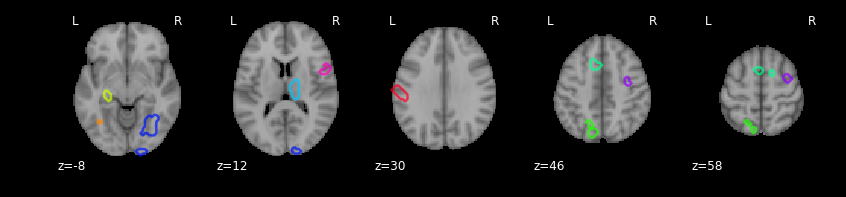

In [1132]:
#difference in conjunction bw groups
g1_img = image.load_img('group1_conj.nii')
g2_img = image.load_img('group2_conj.nii')
dif_img = image.math_img('img1<img2', img1=g1_img, img2=g2_img)
from nilearn import regions
dif_img2, ind = regions.connected_regions(dif_img, min_region_size=1350, extract_type='connected_components', 
                           mask_img= image.load_img('/imaging/mz01/osl2.0.3.2/std_masks/MNI152_T1_2mm_brain_nocerebellum_mask.nii.gz'))
plotting.plot_prob_atlas(dif_img2, bg_img = anatimg,view_type='contours', display_mode='z',
                         cut_coords=(-8,12,30,46,58))


In [1133]:
#transform a 4D label map into 3D
atlas_img_data = np.zeros((dif_img2.get_data().shape[0], dif_img2.get_data().shape[1], 
                      dif_img2.get_data().shape[2]))
for i in range (dif_img2.get_data().shape[3]):
    mask=dif_img2.get_data()[:,:,:,i]==1.0
    atlas_img_data[mask] = i+1 #recode the labels from 1
atlas_img = image.new_img_like(dif_img,atlas_img_data) 

In [1134]:
plotting.view_img(atlas_img, bg_img=anatimg)

/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)
/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/nilearn/plotting/js_plotting_utils.py:100: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than 10 '


In [942]:
view = plotting.view_img('output_2level_group2/2ndLevel/con_0006/spmT_0001_thr.nii', bg_img = anatimg,
                         title='',threshold=2.4)
view

/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)
/imaging/local/software/miniconda/envs/neuroconda_1_4/lib/python3.6/site-packages/nilearn/plotting/js_plotting_utils.py:100: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than 10 '


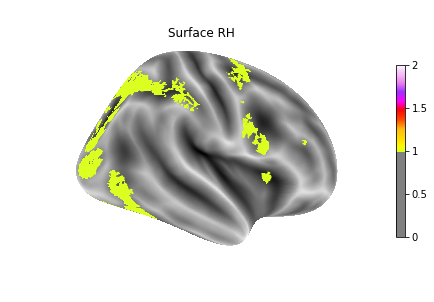

In [49]:
from nilearn import datasets, surface
# fsaverage = datasets.fetch_surf_fsaverage()
# fsaverage.sulc_right = '/imaging/mz01/fsaverage/fsaverage/sulc_right.gii' #change the surface file to the high resolution version
# fsaverage.pial_right = '/imaging/mz01/fsaverage/fsaverage/pial_right.gii'
# fsaverage.infl_right = '/imaging/mz01/fsaverage/fsaverage/inflated_right.gii'
#texture = surface.vol_to_surf(intersect_mask, fsaverage.pial_right)
g= plotting.plot_surf_roi(fsaverage.infl_right, texture, hemi='right',
                            title='Surface RH', colorbar=True, view='lateral',
                            threshold=1., alpha = 0.5, c_map='Reds',bg_map=fsaverage.sulc_right)

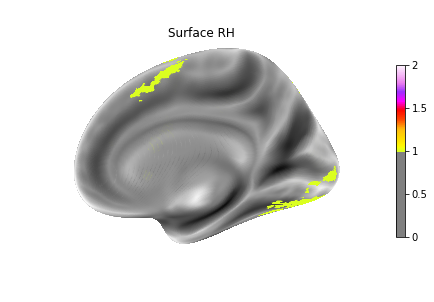

In [48]:
g= plotting.plot_surf_roi(fsaverage.infl_right, texture, hemi='right',
                            title='Surface RH', colorbar=True, view='medial',
                            threshold=1., alpha = 0.5, c_map='Reds',bg_map=fsaverage.sulc_right)

In [ ]:
view = plotting.view_img('conjunction.nii', bg_img = anatimg,
                         title='conjunction',cut_coords=(-6,18,46),threshold='95%')
view

In [ ]:
view = plotting.view_img('conjunction_uncorrected.nii', bg_img = anatimg,
                         title='conjunction',cut_coords=(18,15,61),threshold='95%')
view

## Save figures

In [ ]:
display = plotting.plot_stat_map('output_2level/2ndLevel/con_0002/spmT_0001_thr.nii', bg_img = anatimg,
                         title='STM_load',cut_coords=(15,46,43))
display.savefig('figures/STM_load.png')
display.close()


## Create grey matter mask

In [ ]:
%%bash
TEMPLATE="/imaging/mz01/osl2.0.3.2/spm12/tpm/TPM.nii"

# Extract the first volume with `fslroi`
fslroi $TEMPLATE GM_PM.nii.gz 0 1

# Threshold the probability mask at 10%
fslmaths GM_PM.nii -thr 0.25 -bin /imaging/mz01/fmriprep/GM_mask.nii.gz

# Unzip the mask and delete the GM_PM.nii file
#gunzip /imaging/mz01/fmriprep/GM_mask.nii
rm /imaging/mz01/fmriprep/GM_PM.nii

In [ ]:
plotting.plot_anat('/imaging/mz01/fmriprep/GM_mask.nii', dim=-1)

## How to plot atlas

In [ ]:
from nilearn import datasets

dataset = datasets.fetch_atlas_harvard_oxford('cort-maxprob-thr25-2mm')
atlas_filename = dataset.maps


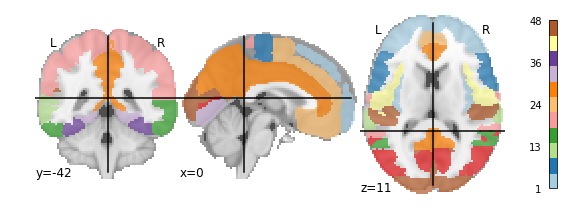

In [514]:
import matplotlib.pyplot as plt
view = plotting.plot_roi(atlas_filename, colorbar=True,cmap='Paired')

In [526]:
coor = plotting.find_parcellation_cut_coords(atlas_filename, background_label=0, return_label_names=True, label_hemisphere='left')

In [512]:
print (dataset.labels[1:])

['Frontal Pole', 'Insular Cortex', 'Superior Frontal Gyrus', 'Middle Frontal Gyrus', 'Inferior Frontal Gyrus, pars triangularis', 'Inferior Frontal Gyrus, pars opercularis', 'Precentral Gyrus', 'Temporal Pole', 'Superior Temporal Gyrus, anterior division', 'Superior Temporal Gyrus, posterior division', 'Middle Temporal Gyrus, anterior division', 'Middle Temporal Gyrus, posterior division', 'Middle Temporal Gyrus, temporooccipital part', 'Inferior Temporal Gyrus, anterior division', 'Inferior Temporal Gyrus, posterior division', 'Inferior Temporal Gyrus, temporooccipital part', 'Postcentral Gyrus', 'Superior Parietal Lobule', 'Supramarginal Gyrus, anterior division', 'Supramarginal Gyrus, posterior division', 'Angular Gyrus', 'Lateral Occipital Cortex, superior division', 'Lateral Occipital Cortex, inferior division', 'Intracalcarine Cortex', 'Frontal Medial Cortex', 'Juxtapositional Lobule Cortex (formerly Supplementary Motor Cortex)', 'Subcallosal Cortex', 'Paracingulate Gyrus', 'Cing